## Sentiment analysis- Data Visualization and  Bag of words & tf-idf methods

We are doing Sentiment analysis on Amazon fine food reviews data taken from Kaggel. The download link is as follows-

https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews?select=Reviews.csv. 

We are using logistic regression to train the model. Other classification alogorithms can also be used to train the model, in place of logistic regression. Here our main ofucs is on Bag of Words(Bow) and tf-idf. 

In [206]:
import pandas as pd

df=pd.read_csv("C:\\Users\\surface\\Reviews.csv")
df.head()


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [207]:
df.Score.value_counts()

5    363122
4     80655
1     52268
3     42640
2     29769
Name: Score, dtype: int64

In [208]:
df1=df#.iloc[0:10000, ]
import nltk
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

In [209]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["br", "href"])
x=" ".join(review for review in df1.Text)

In [210]:
wordcloud = WordCloud(stopwords=stopwords).generate(x)

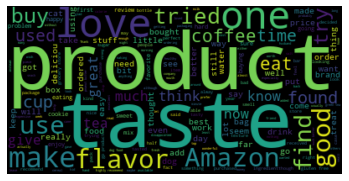

In [211]:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud11.png')
plt.show()

In [212]:
df3=df1[df1.Score!=3]
df3['sentiment'] = df3['Score'].apply(lambda review : 1 if review > 3 else -1)

C:\ProgramData\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [213]:
pos_sentiment=df3[df3.sentiment==1]
neg_sentiment=df3[df3.sentiment==-1]

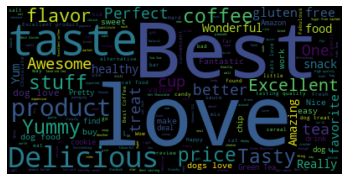

In [214]:
stopwords = set(STOPWORDS)
stopwords.update(["br", "href","good","great"]) 

## good and great removed because they were included in negative sentiment
pos = " ".join(review for review in pos_sentiment.Summary)
wordcloud2 = WordCloud(stopwords=stopwords).generate(pos)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
stopwords = set(STOPWORDS)
stopwords.update(["br", "href","good","great"]) 

## good and great removed because they were included in negative sentiment
neg = " ".join(review for review in neg_sentiment.Summary)
wordcloud2 = WordCloud(stopwords=stopwords).generate(neg)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

In [216]:
df3['sentiment'] = df3['sentiment'].replace({-1 : 'negative'})
df3['sentiment'] = df3['sentiment'].replace({1 : 'positive'})
fig = px.histogram(df3, x="sentiment")
fig = px.histogram(df3, x="sentiment")
fig.show()


C:\ProgramData\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [217]:
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px

In [218]:
%pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [219]:
df3.isnull().sum()

Id                         0
ProductId                  0
UserId                     0
ProfileName               16
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                   25
Text                       0
sentiment                  0
dtype: int64

In [220]:
index=df3.index

In [221]:
import numpy as np 
np.random.randn(len(index))

array([-1.68246121,  0.17220328, -1.05969695, ...,  0.00738361,
       -0.93364377, -1.19208414])

In [222]:
def remove_punctuation(text):
    final = "".join(u for u in text if u not in ("?", ".", ";", ":",  "!",'"'))
    return final
df3['Text'] = df3['Text'].apply(remove_punctuation)
df3 = df3.dropna(subset=['Summary'])
df3['Summary'] = df3['Summary'].apply(remove_punctuation)

C:\ProgramData\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [223]:
dfNew = df3[['Summary','sentiment']]
dfNew.head()

,Summary,sentiment
0,Good Quality Dog Food,positive
1,Not as Advertised,negative
2,Delight says it all,positive
3,Cough Medicine,negative
4,Great taffy,positive


In [224]:
# random split train and test data
from sklearn.model_selection import train_test_split

In [225]:
# Creat a bag of words: count vectorizer:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
X = vectorizer.fit_transform(df3['Summary'])

In [226]:
#vectorizer.fit_transform(train['Summary'])
#vectorizer.transform(test['Summary'])
X_train, X_test, y_train, y_test= train_test_split(X, df3['sentiment'], test_size=0.3)

In [227]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [228]:
#print(list(X))

In [229]:
lr.fit(X_train,y_train)

C:\ProgramData\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [230]:
predictions = lr.predict(X_test)

In [231]:
# find accuracy, precision, recall:
from sklearn.metrics import confusion_matrix,classification_report

confusion_matrix(predictions,y_test)

array([[ 16178,   3345],
       [  8479, 129735]], dtype=int64)

In [232]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

    negative       0.66      0.83      0.73     19523
    positive       0.97      0.94      0.96    138214

    accuracy                           0.93    157737
   macro avg       0.82      0.88      0.84    157737
weighted avg       0.94      0.93      0.93    157737



## Using Tf-idf

In [233]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [241]:
#removing the stopwords form the reviews' text
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

#df3['Summary'] = data['Summary'].apply(lambda x: “ “.join(x.lower() for x in str(x).split()))

stop = stopwords.words('english')    
df3['filtered_Summary']=df3['Summary'].apply(lambda x: " ".join(item for item in word_tokenize(x) if item not in stop))

In [254]:
# can be done in this way- tfidfvectorizer = TfidfVectorizer(analyzer='word' , stop_words='english',)
#So, no need to perform above step

vectorizer = TfidfVectorizer()
  
#vectors = vectorizer.fit_transform(df3['filtered_Summary'])
#feature_names = vectorizer.get_feature_names()
#dense = vectors.todense() # memory error as matrix sie is too large
#denselist = dense.tolist()
#df3_= pd.DataFrame(denselist, columns=feature_names)

In [255]:
X_train, X_test, y_train, y_test= train_test_split(df3['Summary'], df3['sentiment'], test_size=0.3)
vectors = vectorizer.fit_transform(df3['filtered_Summary'])
vectors = vectorizer.fit_transform(df3['filtered_Summary'])

X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

model = LogisticRegression().fit(X_train, y_train)
y_pred=model.predict(X_test)

C:\ProgramData\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [256]:
# find accuracy, precision, recall:
from sklearn.metrics import confusion_matrix,classification_report

confusion_matrix(y_pred,y_test)

array([[ 16000,   3209],
       [  8456, 130072]], dtype=int64)

In [257]:
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

    negative       0.65      0.83      0.73     19209
    positive       0.98      0.94      0.96    138528

    accuracy                           0.93    157737
   macro avg       0.82      0.89      0.84    157737
weighted avg       0.94      0.93      0.93    157737

